# Big Data for Biologists: Decoding Genomic Function- Class 7

## How do you visualize similarities and differences of gene expression profiles across cell types? Part II

##  Learning Objectives
***Students should be able to***
 <ol>
 <li> <a href=#Introkmeans>Explain what the k-means clustering algorithm is </a></li>
 <li> <a href=#Runkmeans>Perform k-means clustering to examine differential gene expression </a></li>
 <li> <a href=#Silhouette>Use silhouette analysis to assess the optimal number of clusters for k-means analysis </a></li>
 <li> <a href=#heatmap>Interpret gene expression data in a heatmap </li>
  

# What is the K-means clustering algorithm?<a name='Introkmeans' />

In classes three and four we learned how to write functions, save them to .py files and import them into Python scripts. We set up a folder called helpers. 

For this class we have prepared a number of helper functions in a file in ../helpers/kmeans_helpers.py. 

One of the helper functions makes scatter plots using code that is similar to what we saw in the last class. It   adds some functionality to plot different styles of points or to change colors. 

Before we import the helper functions, take a look now at the kmeans_helpers file in the helpers directory so you can see what is there. 

In [9]:
#sets up plotting for kmeans algorithm
%matplotlib inline
%load_ext autoreload
%autoreload 2
import matplotlib.pyplot as plt

import sys
sys.path.append('../helpers')
from kmeans_helpers import * 
from RNAseq_helpers import * 

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
#Step 1: Generate a dataset in 2 dimensions with 150 datapoints 
A,B=generate_random_data(150)

In [3]:
len(A)

150

In [4]:
len(B)

150

We plot the data:

In [5]:
plot(A,B)

Thought question: Why can we use the simple command plot to make this plot rather than the long list of commands that we used in the last class? 

Based on a visual inspection of the data, we decide that we would like 3 clusters. It looks like all the data points fall in the range of [-5,5].

In [6]:
k=3
min_val=-5
max_val=5 

The first step in the algorithm is to randomly initialize the cluster centroids. 

In [7]:
x_centroids,y_centroids=initialize_centroids(k,min_val,max_val)

x-coordinates of centroids:[0.18859608018577667, -4.130639778973713, 0.03777281128428012]
y-coordinates of centroids:[-1.28195227566815, 4.72098276138448, 4.4325485017970205]


Thought question: Where could you find the code for the initialize_centroids function either to understand each step or to view if your code needed debugging?  

Plot the cluster centroids that we initialized above:

In [8]:
plot(A,
     B,
     x_centroids=x_centroids,
     y_centroids=y_centroids)

We would like to find the closest centroid to each point. To do this, we will calculate the Euclidean distance from each point to each centroid. Euclidean distance can be found with the formula below: 
![euclidean distance formula](euclidean_distance.png)


In [9]:
#Calculate the distance of each point to each centroid. 
distances=[] 
for cluster_index in range(k): 
    distances.append(distance(A,B,x_centroids[cluster_index],y_centroids[cluster_index]))

print(distances)
print("length of distances: "+ str(len(distances)))

[[5.017245256850274, 2.8017788977028557, 3.940170229135764, 3.883158161492336, 4.402708027150746, 4.360926578032377, 4.432471439040873, 4.000522293882972, 3.921875152126516, 4.155653657001379, 4.3426606152491125, 2.802711681941928, 4.447462609958332, 3.5567809654197076, 4.028346841754931, 4.642838443336023, 4.337755904896109, 3.310030719685271, 3.5731015876872525, 3.2461748123107297, 4.157752963097601, 4.490765822472709, 4.955404316420978, 4.54162597511673, 4.155965258931728, 4.091086943584958, 4.873310529045547, 4.4403664933271285, 3.9930976120467094, 3.9816493654284133, 4.5036261867422756, 4.303150457655023, 4.547625985018733, 4.515806557457303, 3.793174979592601, 3.557138321123914, 3.994853495202192, 4.207856404773118, 3.5731467035921813, 3.720579995069682, 3.971016882690741, 4.206709543892397, 3.5668163267166366, 3.837621004548923, 3.8966066167224214, 3.4624276269839354, 4.0720840013023745, 3.5622922704264885, 4.114750298440636, 4.012999773612027, 2.5706362448660607, 3.160013768495

Thought questions: 

Why is the length of distances 3? What does each sublist represent? 

The variable distances is defined as "distances=[ ]"in the code above and it is also defined as "distances=[ ]" as the first line in the distance helper function defined in kmeans_helpers.py. Why do the distances for each centroid get appended to distances instead of getting erased each time the for loop gets called for a new centroid?

In [10]:
#Assign each point to the cluster corresponding to the nearest centroid. 
num_points=len(A)
cluster_assignments=assign_cluster(distances,num_points)

In [11]:
print(cluster_assignments)

[1, 0, 2, 1, 2, 2, 1, 2, 2, 1, 1, 0, 1, 2, 2, 1, 1, 0, 2, 0, 1, 2, 1, 2, 1, 2, 1, 2, 2, 1, 2, 2, 1, 1, 2, 0, 2, 1, 2, 0, 2, 2, 2, 2, 2, 2, 1, 2, 1, 1, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 0, 2, 0, 2, 0, 0, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 2, 0, 2, 0, 0, 0, 2, 2, 2, 2, 0, 2, 2, 0, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2]


In [12]:
#plot the data with cluster assignments --red indicates points in cluster 0, blue in cluster 1 and green in cluster 2. 
plot(A,
     B,
     x_centroids=x_centroids,
     y_centroids=y_centroids,
     cluster_assignments=cluster_assignments)

Now, we re-calculate the centroid positions so that the centroids are at the mid-point of each cluster. We use the helper function 'update_centroids' that is defined in helpers/kmeans_helpers.py

In [13]:
#call the function to update the centroids 
x_centroids,y_centroids=update_centroids(A,B,cluster_assignments,k)
print("updated x_centroids:"+str(x_centroids))
print("updated y_centroids:"+str(y_centroids))
plot(A,
    B,
    cluster_assignments=cluster_assignments,
    x_centroids=x_centroids,
    y_centroids=y_centroids)

updated x_centroids:[0.30857941288201202, -2.4677836882236934, 0.31921383729814229]
updated y_centroids:[1.0063189307371394, 2.1581993903277721, 2.1510893664759676]


In [14]:
# We repeat this cycle of assigning points to cluster and updating the cluster centroids. 
# At each iteration, you should observe an improved separation of the datapoints. 


#We combine the functions we have written above to produce a full iteration of the k-means clustering algorithm. 
def iterate(x,y,x_centroids,y_centroids,k): 
    num_points=len(x)
    
    #calculate centroid distances 
    distances=[] 
    for cluster_index in range(k): 
        distances.append(distance(x,y,x_centroids[cluster_index],y_centroids[cluster_index]))
        
    #Assign each point to the cluster corresponding to the nearest centroid. 
    cluster_assignments=assign_cluster(distances,num_points)

    #update the centroid assignments 
    x_centroids,y_centroids=update_centroids(x,y,cluster_assignments,k)
    
    #generate a plot 
    plot(x,
        y,
        x_centroids=x_centroids,
        y_centroids=y_centroids,
        cluster_assignments=cluster_assignments)
    
    #return the new cluster assignments and centroid values 
    return cluster_assignments,x_centroids,y_centroids

In [15]:
#run an iteration of the algorithm 
#run this code block several times to observe progress improvements in cluster assignments 
cluster_assignments,x_centroids,y_centroids=iterate(A,B,x_centroids,y_centroids,k)

In [16]:
#Finally, we define the end-criteria -- the algorithm is complete when the cluster assignments are no longer changing. 
def check_finished(old_cluster_assignments,new_cluster_assignments): 
    for i in range(len(old_cluster_assignments)): 
        if old_cluster_assignments[i]!=new_cluster_assignments[i]: 
            return False 
    return True 

In [17]:
#We put all the steps above together to define the full k-means clustering algorithm 
def k_means(x,y,k): 
    min_val=min(x+y)
    max_val=max(x+y)
    x_centroids,y_centroids=initialize_centroids(k,min_val,max_val)
    cluster_assignments,x_centroids,y_centroids=iterate(x,y,x_centroids,y_centroids,k)
    finished=False 
    while (finished==False): 
        new_assignments,x_centroids,y_centroids=iterate(x,y,x_centroids,y_centroids,k)
        finished=check_finished(cluster_assignments,new_assignments)
        cluster_assignments=new_assignments
    return cluster_assignments

In [18]:
#Let's run the full algorithm on our toy dataset 
cluster_assignments=k_means(A,B,3)

x-coordinates of centroids:[-0.098855679798498297, 1.7007800988595214, -1.10958639784583]
y-coordinates of centroids:[-1.8804519962721071, 0.6267756342596682, 2.7323140889619149]


What would happen if you chose a different value of k (number of clusters)? 


In [19]:
#TODO:use the k_means function defined above to run k-means clustering 
#on A,B for k=2 and k=4. 

#Which value of k (2,3, or 4) gives the best separation of the datapoints into cohesive clusters? 

# Using K-means clustering to examine differential gene expression. <a name='Runkmeans' />

We will now examine differential gene expression analysis across 4 organ systems. We pick the following four systems to include in the analysis: 

* Blood 
* Embryonic
* Immune 
* Respiratory 

In the example above, we wrote the k-means clustering code "from scratch". However, python already has a KMeans clustering function in the scikit learn library, which is more efficient for clustering large datasets than the function that we wrote above. We will use the built-in KMeans function in our further data analysis. 

In [1]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score,silhouette_samples


In [21]:
#use the help command to learn more about the KMeans clustering function. 
#Uncomment the following line of code to run the "help" function 
help(KMeans)

Help on class KMeans in module sklearn.cluster.k_means_:

class KMeans(sklearn.base.BaseEstimator, sklearn.base.ClusterMixin, sklearn.base.TransformerMixin)
 |  K-Means clustering
 |  
 |  Read more in the :ref:`User Guide <k_means>`.
 |  
 |  Parameters
 |  ----------
 |  
 |  n_clusters : int, optional, default: 8
 |      The number of clusters to form as well as the number of
 |      centroids to generate.
 |  
 |  max_iter : int, default: 300
 |      Maximum number of iterations of the k-means algorithm for a
 |      single run.
 |  
 |  n_init : int, default: 10
 |      Number of time the k-means algorithm will be run with different
 |      centroid seeds. The final results will be the best output of
 |      n_init consecutive runs in terms of inertia.
 |  
 |  init : {'k-means++', 'random' or an ndarray}
 |      Method for initialization, defaults to 'k-means++':
 |  
 |      'k-means++' : selects initial cluster centers for k-mean
 |      clustering in a smart way to speed up co

In [12]:
import pandas as pd 
systems_subset=["Blood","Embryonic","Immune","Respiratory"]
data,batches=load_rnaseq_data(systems_subset=systems_subset,filepath='../datasets/RNAseq/diff_genes/diff_genes_top.tsv',batches='../datasets/RNAseq/rnaseq_batches.txt')
data=data.transpose()
data.shape

(116, 1543)

In [1]:
#Run the kmeans clustering algorithm on the data with four clusters
k=4
clusters=scikit_kmeans(data,k)

NameError: name 'scikit_kmeans' is not defined

We would like a way to determine how well the k-means clustering has separated the data. One way to assess the performance of the clustering algorithm is to compare inter-cluster distance to intra-cluster distance. We would like points in the same cluster to be near each other, and points that are in different clusters to be far apart: 
![Inter-cluster and intra-cluster distance](inter_cluster_vs_intra_cluster.png)

# Use silhouette analysis to assess the optimal number of clusters for k-means analysis <a name='Silhouette' />


**Silhouette analysis** allows us to compute the ratio of inter-cluster distance to intra-cluster distance for each cluster. The silhouette plot displays a measure of how close each point in one cluster is to points in the neighboring clusters and thus provides a way to assess parameters like number of clusters visually. This measure has a range of [-1, 1].

Silhouette coefficients  near +1 indicate that the sample is far away from the neighboring clusters. A value of 0 indicates that the sample is on or very close to the decision boundary between two neighboring clusters and negative values indicate that those samples might have been assigned to the wrong cluster. 

By calculating the average silhuoette score across all samples, which will also fall in the range [-1,1], we can assess how well separated the data is. 

We have written a wrapper called ** scikit_silhouette** around the scikit learn silhouette graphing function. Run this function on our data to determine how well the clustering separates samples into similar groups:

For n_clusters = 4 The average silhouette_score is : 0.667272821439


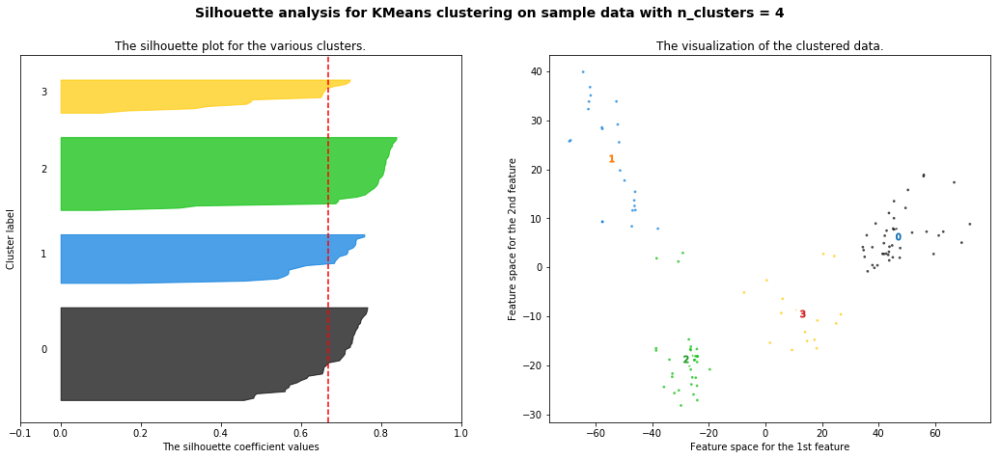

In [24]:
scikit_silhouette(data,k)

What happens as we vary the number of clusters from k=2 to k=10? 

For n_clusters = 2 The average silhouette_score is : 0.655860928871


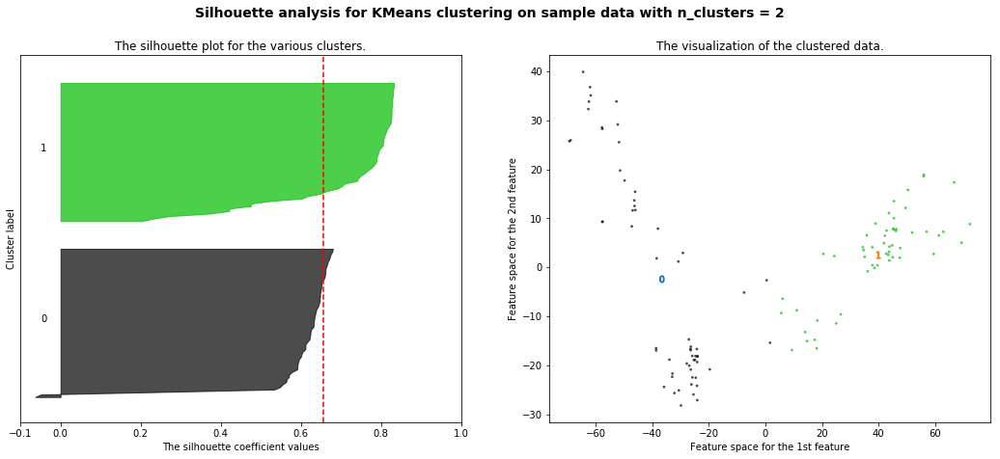

For n_clusters = 3 The average silhouette_score is : 0.668563574067


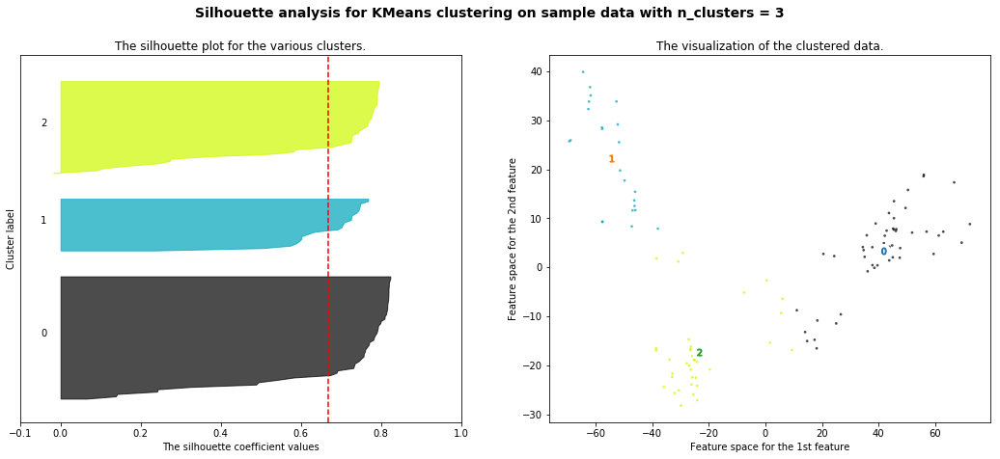

For n_clusters = 4 The average silhouette_score is : 0.667272821393


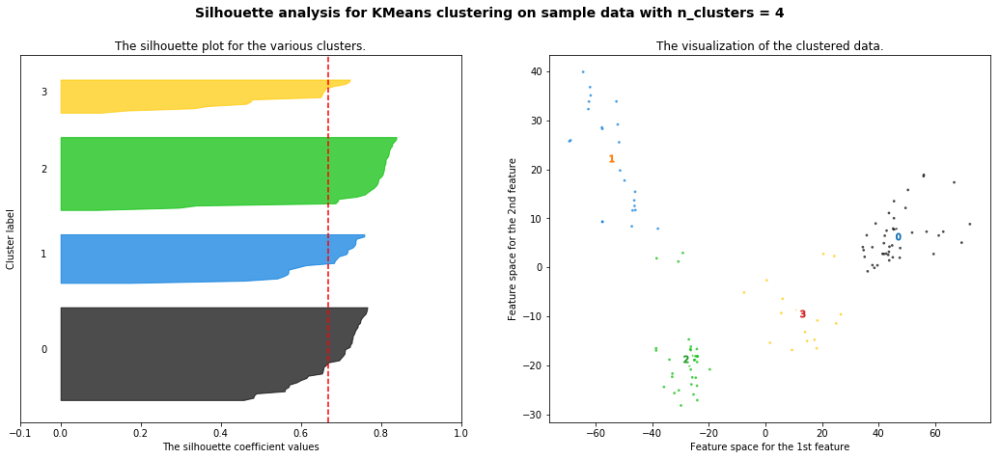

For n_clusters = 5 The average silhouette_score is : 0.654179358955


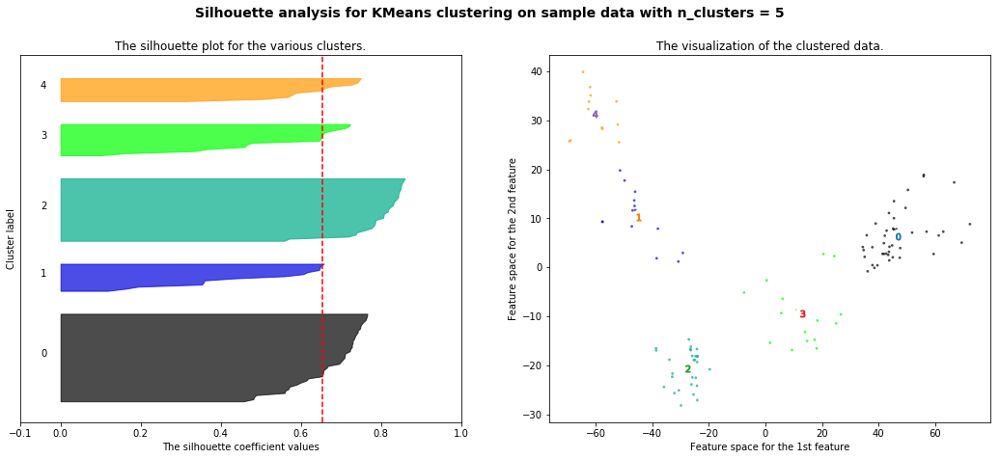

For n_clusters = 6 The average silhouette_score is : 0.606585475815


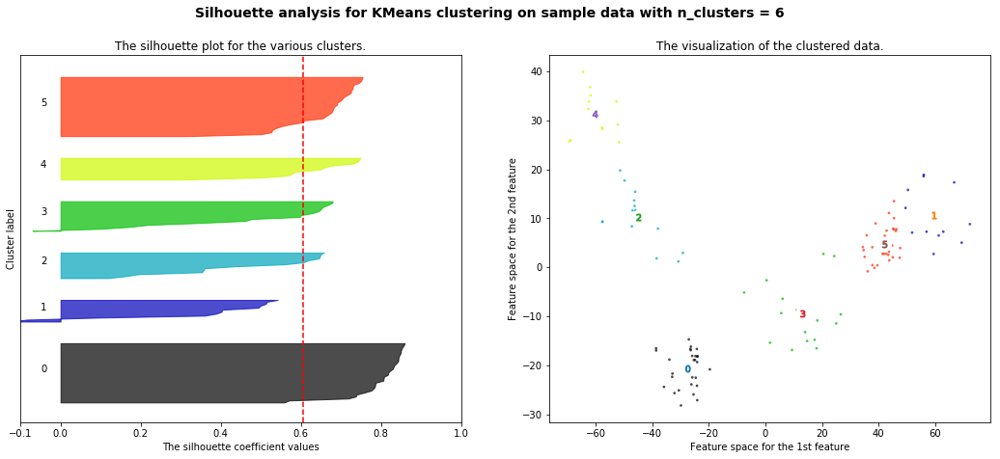

In [25]:
for k in range(2,7): 
    scikit_silhouette(data,k)

We can plot the average silhouette score for different values of k and pick the value of k that gives the highest average silhouette. 

In [26]:
k=[2,3,4,5,6]
scores=[0.66,0.67,0.67,0.65,0.61] 



In [27]:
import plotly 
plotly.offline.init_notebook_mode()
import plotly.graph_objs as go  
b=[go.Bar(x=k,y=scores,name="Silhuoette Scores for varied k")]
fig=go.Figure(data=b,layout=go.Layout(barmode="group"))
plotly.offline.iplot(fig)

It appears that the data is best separated by 3 or 4 clusters. 

# Interpreting gene expression data in a heatmap <a name='heatmap' />

We can visualize the 116 clustered samples in a heatmap, with samples along the y-axis and genes along the x-axis.  Note how we can see four distinct clusters  in the data. The heatmap values correspond to gene expression levels for each gene in each sample.

In [36]:
#sort the data by cluster assignment 
#Add a column to the data frame containing the cluster assignments 
data['Clusters']=clusters
#Sort the data by the Clusters column 
data=(data.sort_values(by=list(data.columns),axis=0)).sort_values(by="Clusters",axis=0)

print(data.head(10))

                                                    ENSG00000269416.1  \
ENCSR000AED.GM12878_Lymphoblastoid_Cells.CSHL_G...          -0.519602   
ENCSR000AEO.K562_Leukemia_Cells.UConn_Graveley               0.077981   
ENCSR357XTU.Primary_Natural_Killer_cells_from_p...           0.720639   
ENCSR897KTO.Alveolus_Epithelial_Primary_Cells.C...           0.732919   
ENCSR000AAS.Trachea_Smooth_Muscle_Primary_Cells...           0.759712   
ENCSR499NEL.Fetal_Lung.UW_Glass                              0.796833   
ENCSR000AEC.GM12878_Lymphoblastoid_Cells.CSHL_G...           0.176536   
ENCSR000CUC.Primary_monocytes_from_peripheral_b...           0.468682   
ENCSR944FLL.Primary_T_CD8._cells_from_periphera...           0.208055   
ENCSRMAR044.Primary_T_regulatory_cells_from_per...           0.059657   

                                                    ENSG00000008517.12  \
ENCSR000AED.GM12878_Lymphoblastoid_Cells.CSHL_G...            5.052120   
ENCSR000AEO.K562_Leukemia_Cells.UConn_Graveley  

In [29]:
plot_heatmap_samples(data,batches)

Thought questions: 
* What does each box in the heatmap represent?
* What does each column represent?
* What does each row represent?  